In [47]:
import numpy as np
import random
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon
import networkx as nx
from scipy.spatial import KDTree
import heapq
from scipy.spatial import Voronoi, voronoi_plot_2d

from utils import collision_free
from utils import plot_PRM
from utils import initialize_samples
from utils import calculate_triangle_area
from utils import plot_halton_voronoi
from utils import plot_hammersley_voronoi
from utils import radical_inverse
from utils import filter_samples


In [48]:
MAX_SAMPLES = 1000

#### Problema de planificación


In [49]:
# Espacio de configuraciones: (0,10)^2
x_lim = (0, 10)
y_lim = (0, 10)

# triángulos [(2,2), (5,5), (4,1)], [(8,8), (7,5), (9,4)],  [(7,2), (8,1), (6,2)], [(2,8), (4,6), (6,8)]$
obstacles = [
    ([2, 5, 4],
     [2, 5, 1]),
    ([8, 7, 9],
     [8, 5, 4]),
    ([7, 8, 6],
     [2, 1, 2]),
    ([2, 4, 6],
     [8, 6, 8]),
]

# configuracion inicial
start = np.array([8.1, 9.2])

# configuración final
goal = np.array([1.5, 0.99])

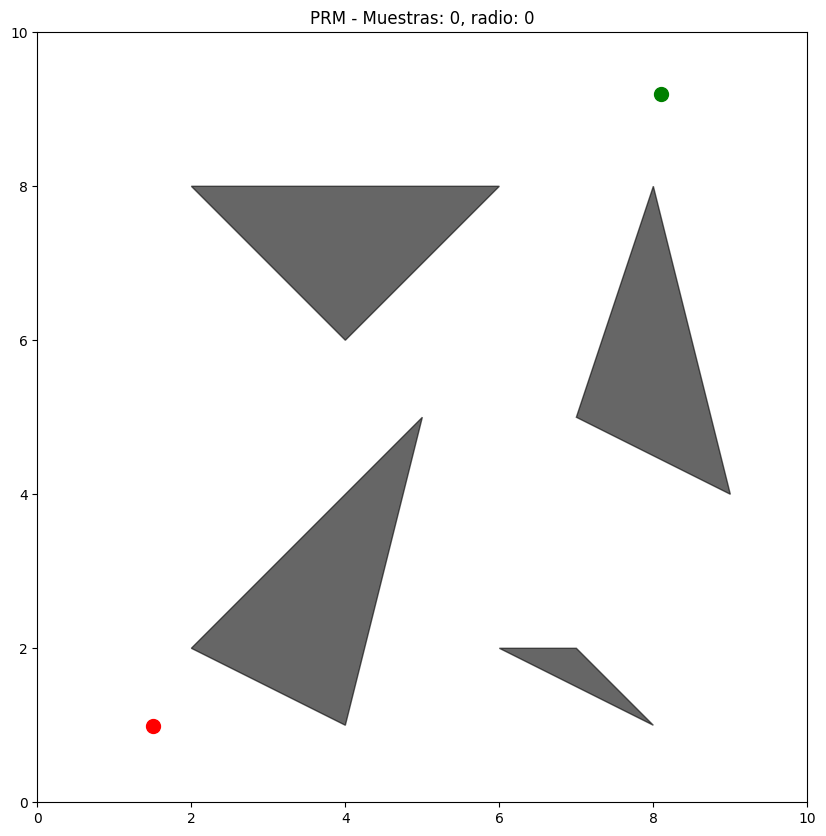

In [50]:
plot_PRM([],[], 0, obstacles, x_lim, y_lim, start, goal)

#### PRM

In [51]:
class PRM:
    def __init__(self):
        self.V = []
        self.E = []
        self.radio = 0

    def __init__(self, muestras, obstaculos, radio):
        self.V = muestras
        self.E = []
        self.radio = radio

        kdtree = KDTree(self.V)
        for i, v in enumerate(self.V):
            neighbors = kdtree.query_ball_point(v, self.radio)
            for u_idx in neighbors:
                if u_idx != i:
                    u = self.V[u_idx]
                    if collision_free(v, u, obstaculos):
                        self.E.append((i, u_idx))

    def get_PRM(self):
        return self.V, self.E

    def plot_original_PRM(self):
        plot_PRM(self.V, self.E, self.radio, obstacles, x_lim, y_lim)

    def add_query_points(self, start, goal):
        self.qV = self.V.copy()
        self.qE = self.E.copy()
        kdtree = KDTree(self.qV)

        self.qV.append(start)
        start_idx = len(self.qV) - 1
        self.qV.append(goal)
        goal_idx = len(self.qV) - 1

        start_neighbors = kdtree.query_ball_point(start, self.radio)
        for u_idx in start_neighbors:
            if collision_free(start, self.qV[u_idx], obstacles):
                self.qE.append((start_idx, u_idx))

        goal_neighbors = kdtree.query_ball_point(goal, self.radio)
        for u_idx in goal_neighbors:
            if collision_free(goal, self.V[u_idx], obstacles):
                self.qE.append((goal_idx, u_idx))

        return self.qV, self.qE, start_idx, goal_idx

    def find_shortest_path(self,start, goal):
        #_ , _ , start_idx, goal_idx = self.add_query_points(start, goal)
        #print("start_idx: ", start_idx)
        #print("goal_idx: ", goal_idx)
        G = nx.Graph()
        for i, j in self.qE:
            G.add_edge(i, j, weight=np.linalg.norm(np.array(self.qV[i]) - np.array(self.qV[j])))
        try:
            path = nx.shortest_path(G, source=start_idx, target=goal_idx, weight='weight')
            return [self.qV[i] for i in path]
        except nx.NetworkXNoPath:
            return None

    def min_path_cost(self,start, goal):
        path = self.find_shortest_path(start,goal)
        return sum(np.linalg.norm(np.array(path[i]) - np.array(path[i+1])) for i in range(len(path)-1))

    def plot_query_PRM(self, x_init, x_goal, path=None):
        path = self.find_shortest_path(x_init, x_goal)
        plot_PRM(self.qV, self.qE, self.radio ,obstacles, x_lim, y_lim, start, goal, path)
        print("Costo del camino: ", self.min_path_cost(x_init, x_goal))

    def summary(self):
        print("PRM ---------------------------------------------------------------")
        print("Cantidad de muestras: ", len(self.V))
        print("Cantidad de aristas: ", len(self.E))
        print("Radio de conexión: ", self.radio)
        print("Longitud del camino más corto:", self.min_path_cost(start, goal))
        print("-------------------------------------------------------------------")

In [52]:
samples = []
descartadas = [] # contiene las aceptadas Y las descartas
initialize_samples(samples,descartadas, x_lim, y_lim, obstacles, MAX_SAMPLES)

In [53]:
radio = 2
prm_instance = PRM(samples[:200], obstacles, radio)

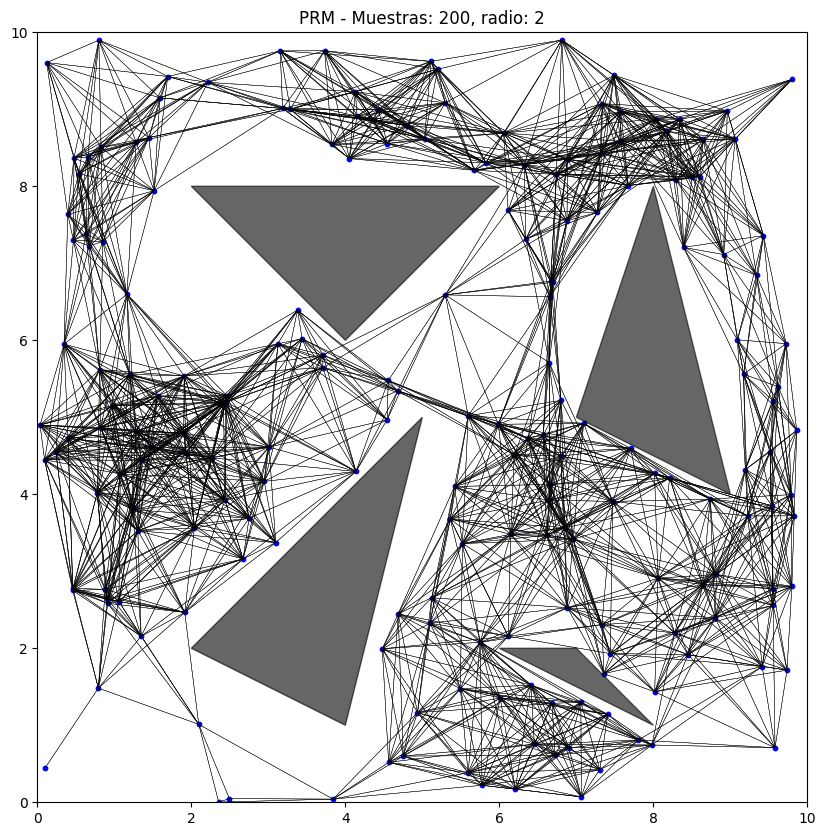

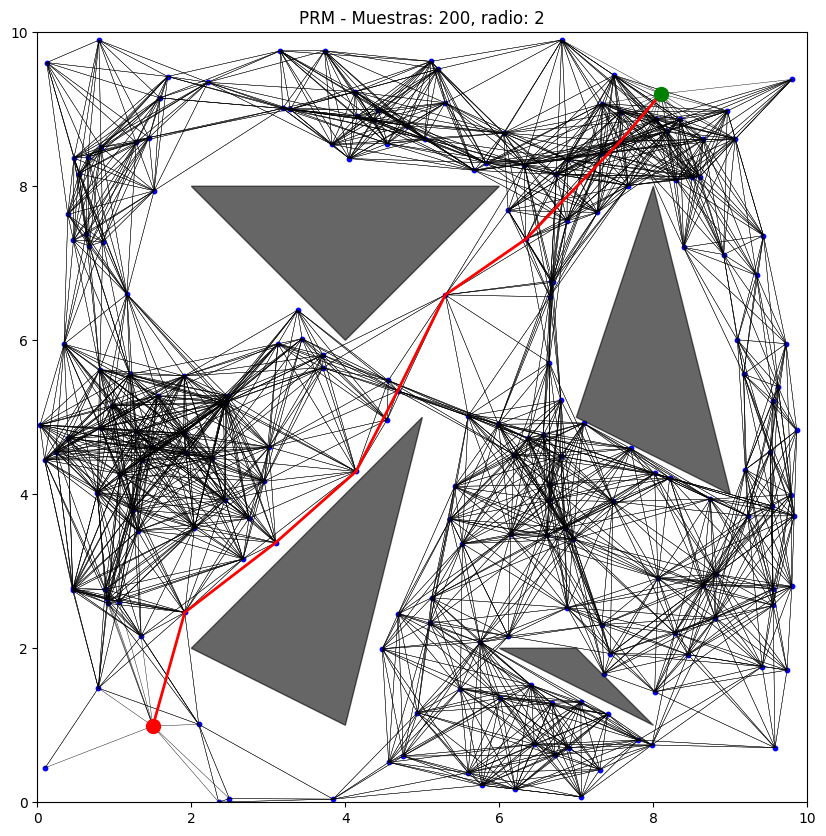

Costo del camino:  10.834883882714713
PRM ---------------------------------------------------------------
Cantidad de muestras:  200
Cantidad de aristas:  3932
Radio de conexión:  2
Longitud del camino más corto: 10.834883882714713
-------------------------------------------------------------------


In [54]:
prm_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

In [55]:
radio = 2
prm_instance = PRM(samples[:500], obstacles, radio)

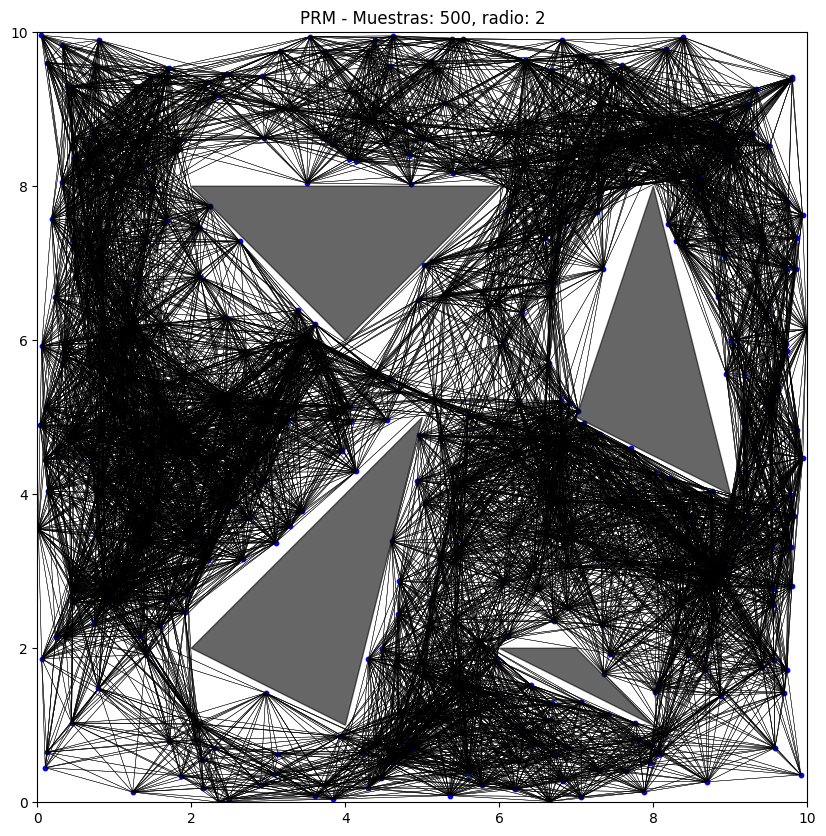

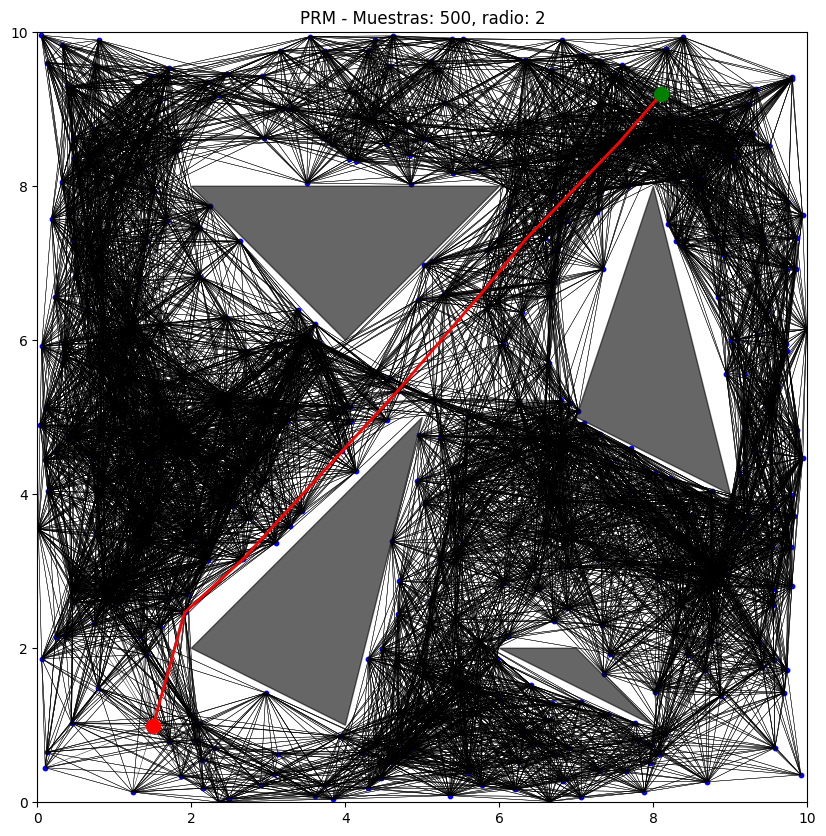

Costo del camino:  10.684000961856789
PRM ---------------------------------------------------------------
Cantidad de muestras:  500
Cantidad de aristas:  23744
Radio de conexión:  2
Longitud del camino más corto: 10.684000961856789
-------------------------------------------------------------------


In [56]:
prm_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

####PRM*

In [57]:
class PRM_star(PRM):
    def __init__(self, muestras, obstaculos):
        def gamma_PRM(x_lim, y_lim, obstacles):
            d = 2
            total_area = (x_lim[1] - x_lim[0]) * (y_lim[1] - y_lim[0])

            obstacle_area = 0
            for obstacle in obstacles:
                x = obstacle[0]
                y = obstacle[1]
                vertices = list(zip(x, y))
                obstacle_area += calculate_triangle_area(vertices)

            free_area = total_area - obstacle_area
            zeta_d = np.pi

            gamma_PRM = 2 * (1 + 1/d)**(1/d) * (free_area / zeta_d)**(1/d)

            return gamma_PRM

        def optmized_radius(n_samples=-1):
            epsilon = 1/1000
            gamma_prm = gamma_PRM(x_lim, y_lim, obstacles)

            r = gamma_prm * (np.log(n_samples) / n_samples) ** (1/2) + epsilon
            return r

        super().__init__(muestras, obstaculos, optmized_radius(len(muestras)))

    def summary(self):
        print("PRM* ---------------------------------------------------------------")
        print("Cantidad de muestras: ", len(self.V))
        print("Cantidad de aristas: ", len(self.E))
        print("Radio de conexión: ", self.radio)
        print("Longitud del camino más corto:", self.min_path_cost(start, goal))

In [58]:
prm_star_instance = PRM_star(samples[:200], obstacles)

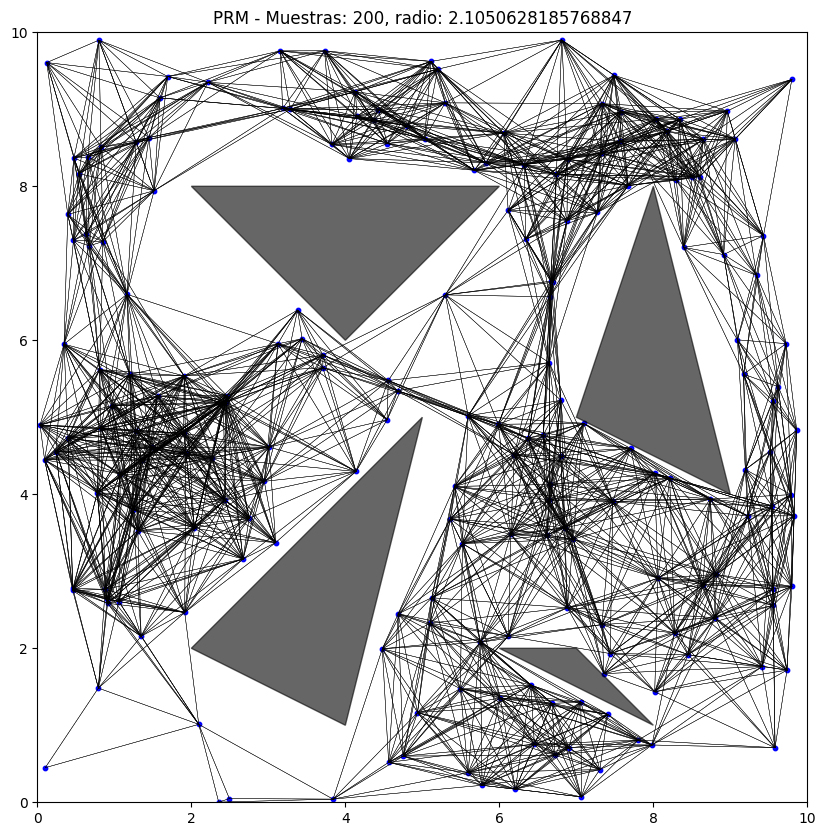

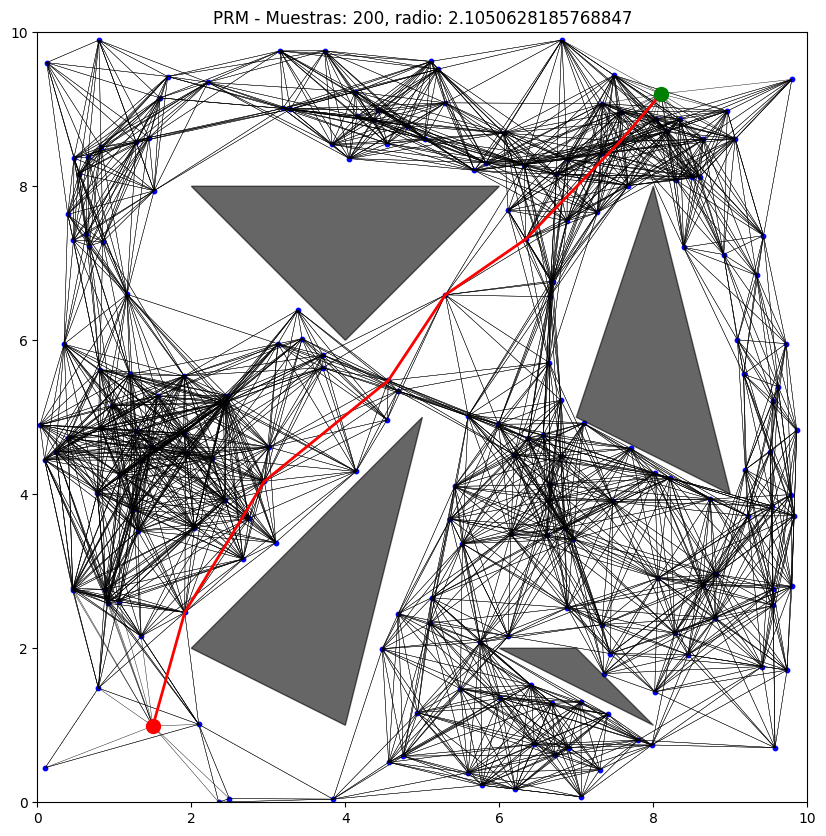

Costo del camino:  10.78557909077595
PRM* ---------------------------------------------------------------
Cantidad de muestras:  200
Cantidad de aristas:  4264
Radio de conexión:  2.1050628185768847
Longitud del camino más corto: 10.78557909077595


In [59]:
prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

In [60]:
prm_star_instance = PRM_star(samples[:500], obstacles)

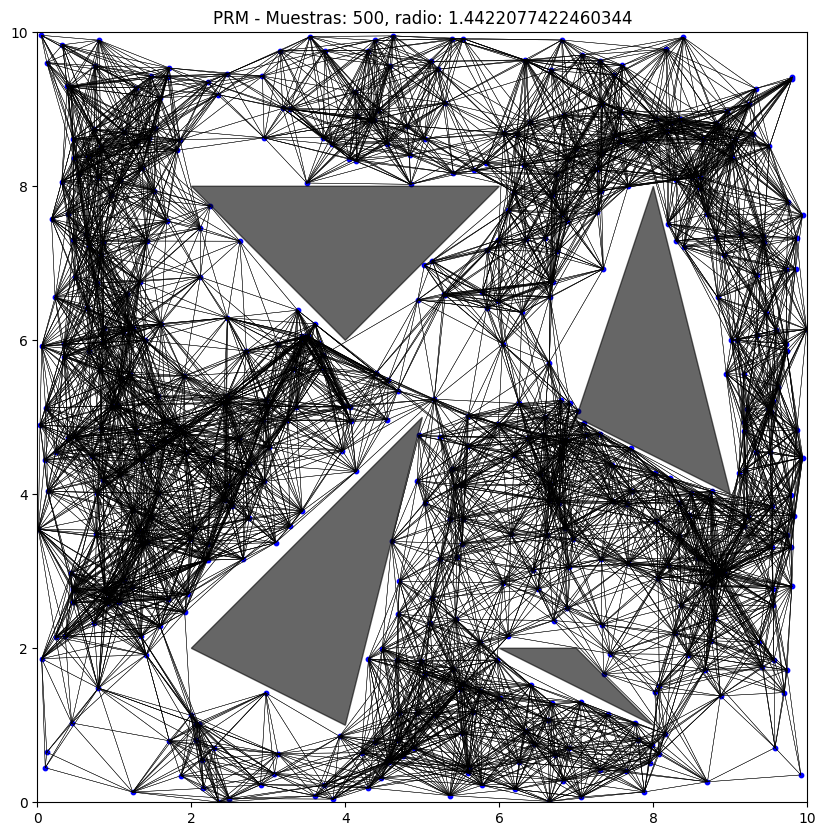

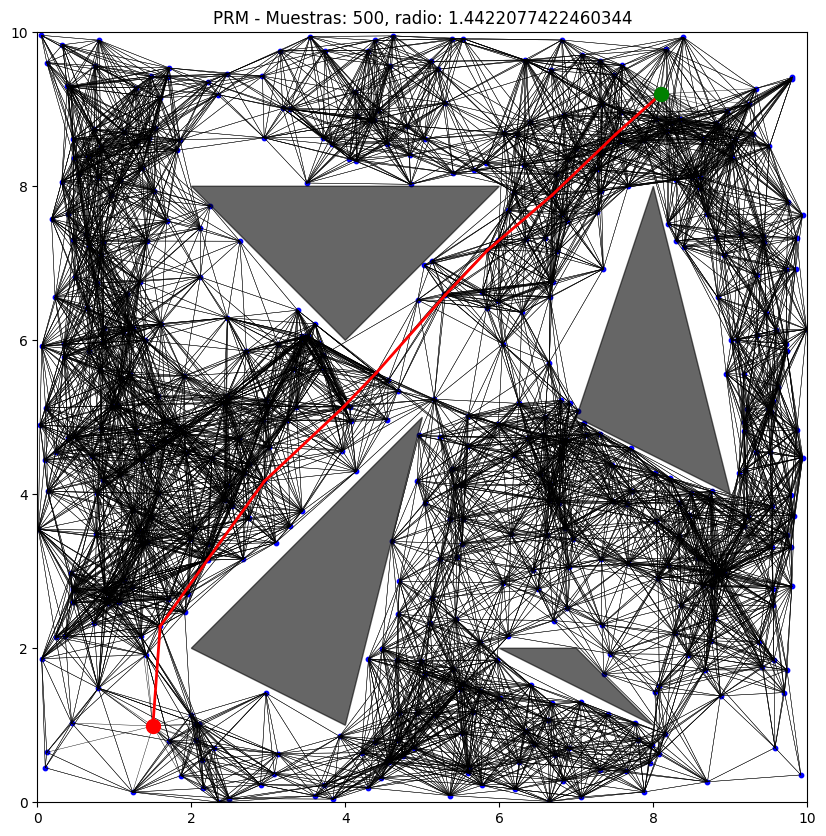

Costo del camino:  10.827344022419569
PRM* ---------------------------------------------------------------
Cantidad de muestras:  500
Cantidad de aristas:  14312
Radio de conexión:  1.4422077422460344
Longitud del camino más corto: 10.827344022419569


In [61]:
prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

#### Generación de muestras - baja dispersión - Secuencia de Halton

In [62]:
def halton_sequence(N, b1=2, b2=3):
    points = np.zeros((N, 2))
    for n in range(N):
        points[n, 0] = radical_inverse(n, b1)
        points[n, 1] = radical_inverse(n, b2)
    return points

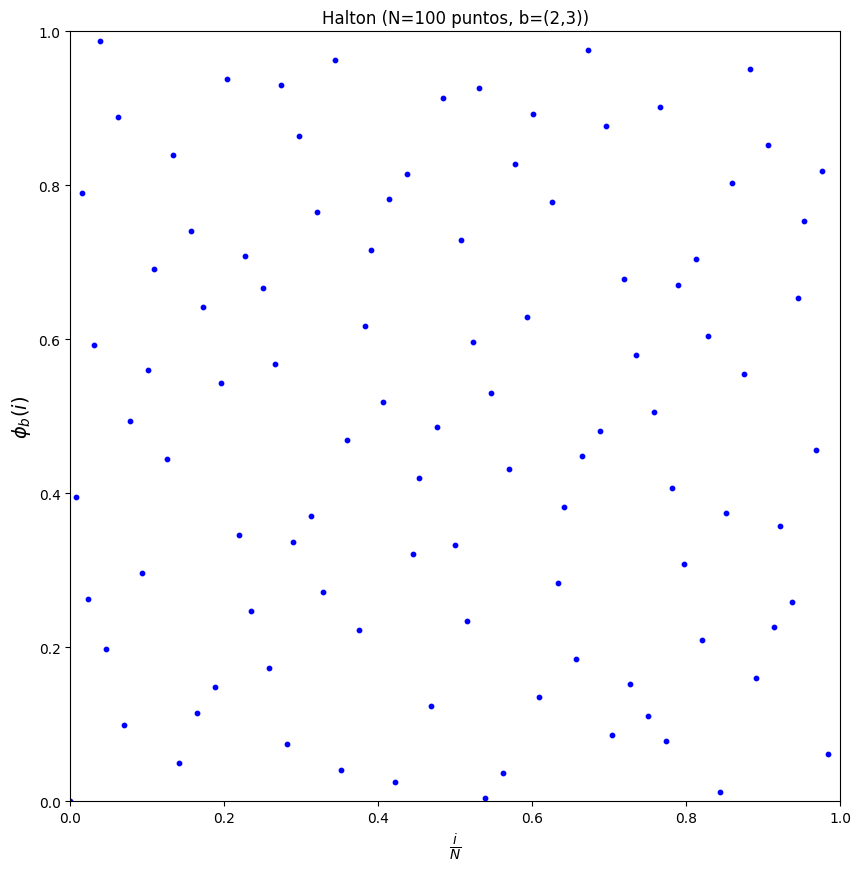

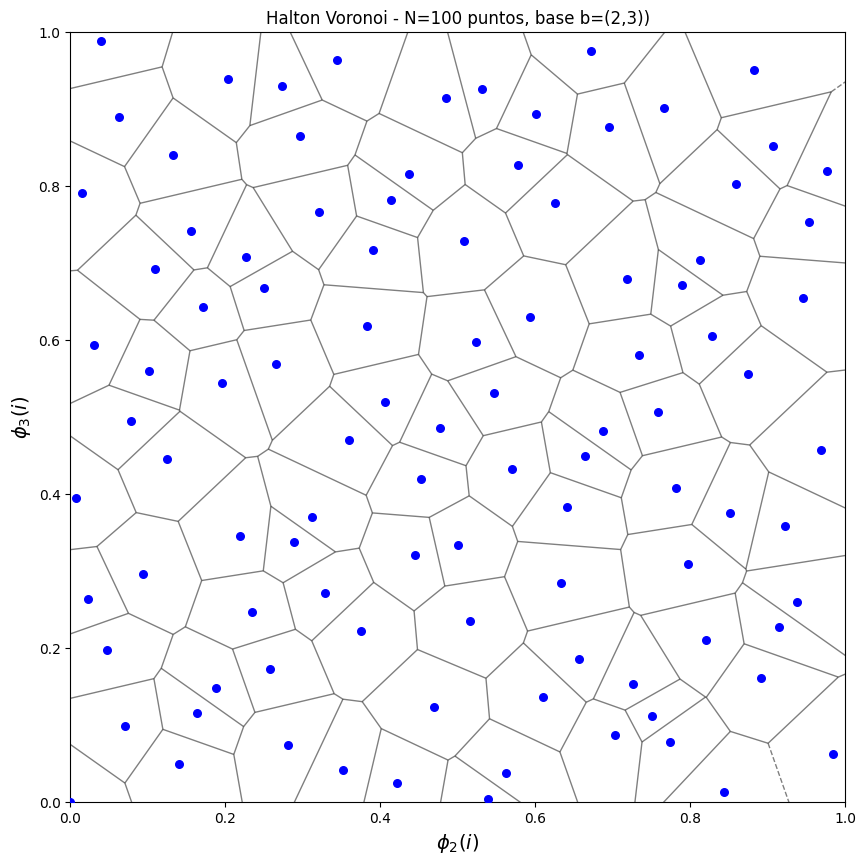

In [63]:
b1, b2 = 2, 3 # d coprimos
halton_points = halton_sequence(100, b1,b2)*10
plot_halton_voronoi(100)

#### Generación de muestras - baja dispersión - Secuencia de Hammersley

In [64]:
def hammersley_sequence(N, b=2):
    points = np.zeros((N, 2))
    for n in range(N):
        points[n, 0] = n / N
        points[n, 1] = radical_inverse(n, b)  # Van der Corput 2D
    return points

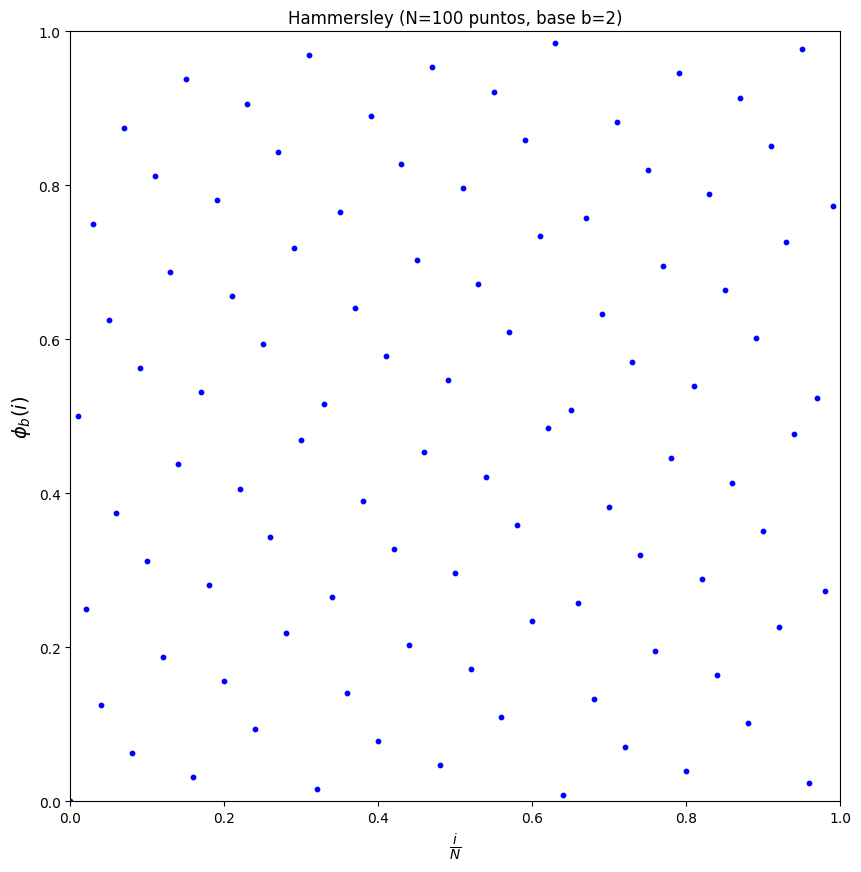

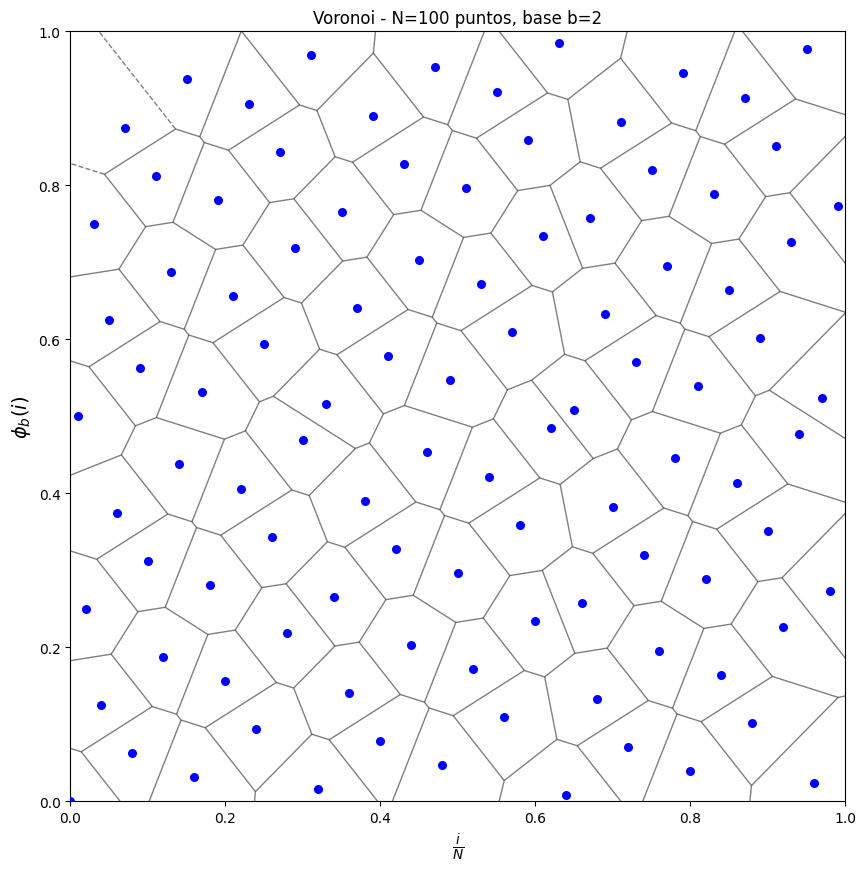

In [65]:
hammersley_points = hammersley_sequence(100, b1)*10
plot_hammersley_voronoi(100)

#### PRM con muestras de baja dispersion

In [75]:
halton_points = halton_sequence(100, b1)*10
filtered_halton = [[np.float64(x) for x in row] for row in filter_samples(halton_points, obstacles)]

prm_instance = PRM(filtered_halton, obstacles, radio)

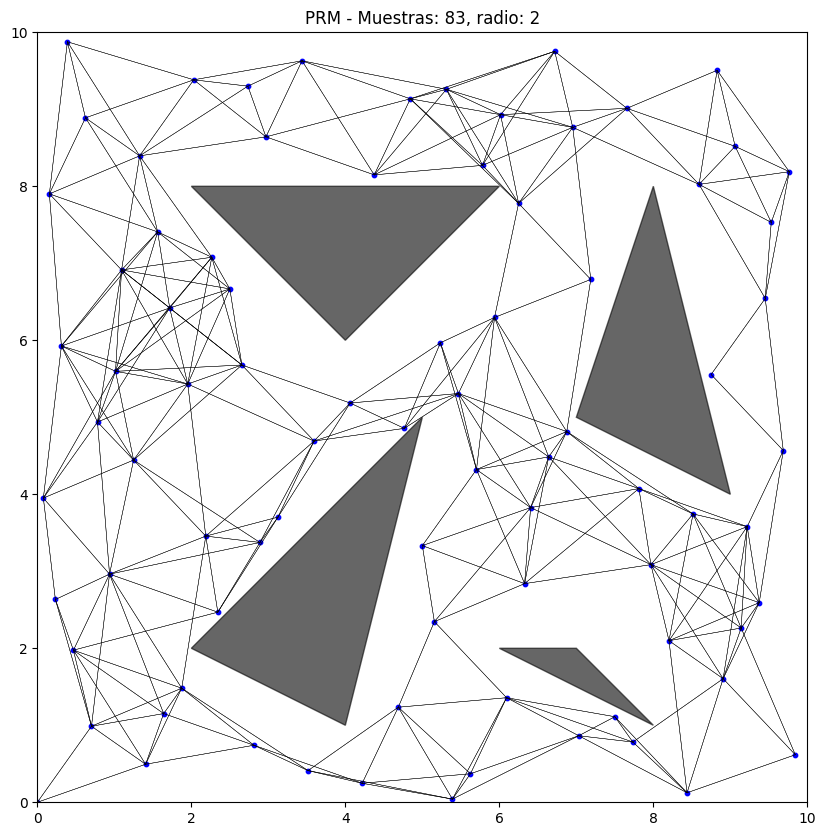

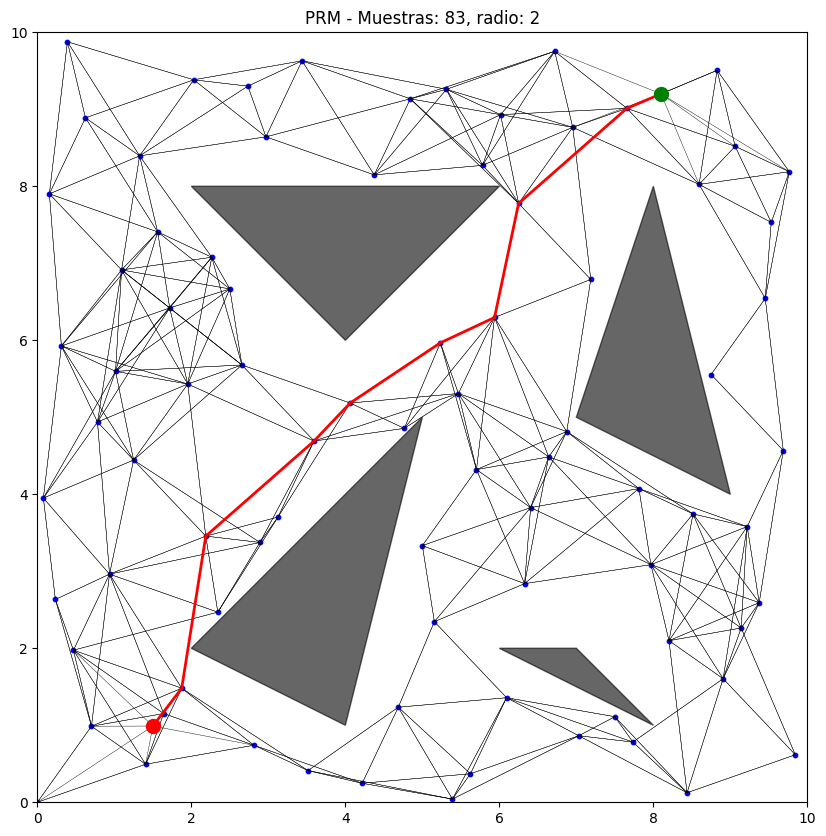

Costo del camino:  11.222557630248492
PRM ---------------------------------------------------------------
Cantidad de muestras:  83
Cantidad de aristas:  548
Radio de conexión:  2
Longitud del camino más corto: 11.222557630248492
-------------------------------------------------------------------


In [78]:
prm_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

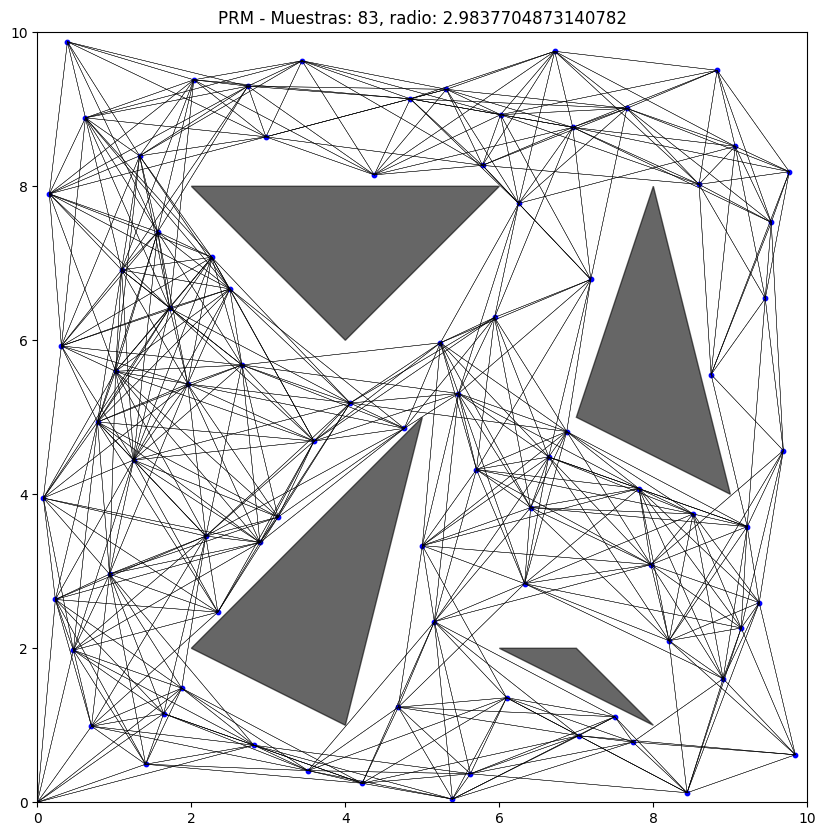

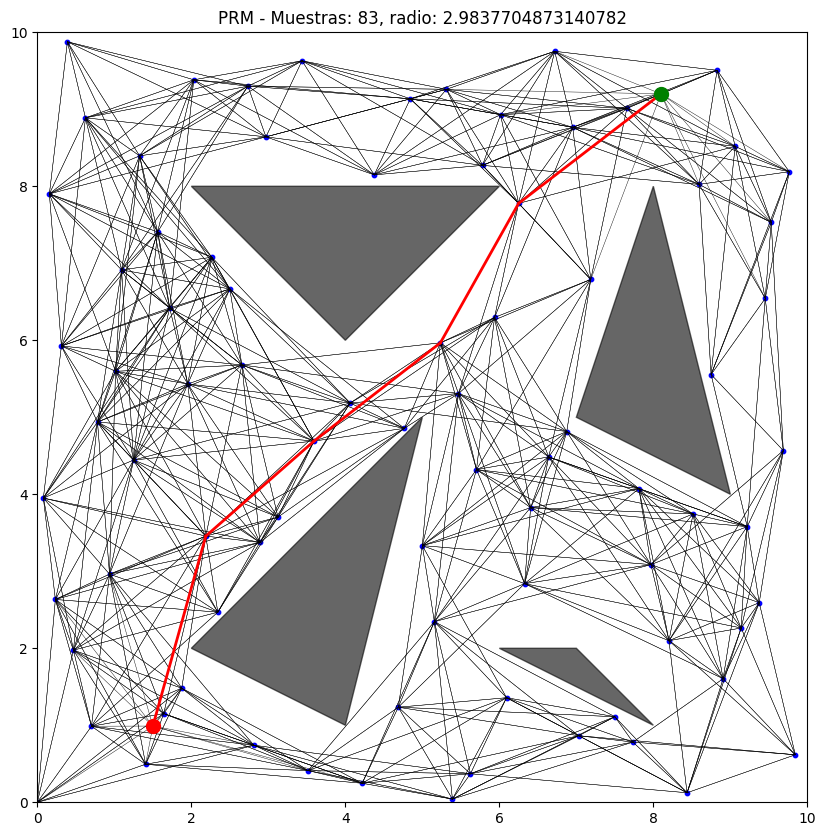

Costo del camino:  10.919915392490656
PRM* ---------------------------------------------------------------
Cantidad de muestras:  83
Cantidad de aristas:  1024
Radio de conexión:  2.9837704873140782
Longitud del camino más corto: 10.919915392490656


In [81]:
prm_star_instance = PRM_star(filtered_halton, obstacles)

prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

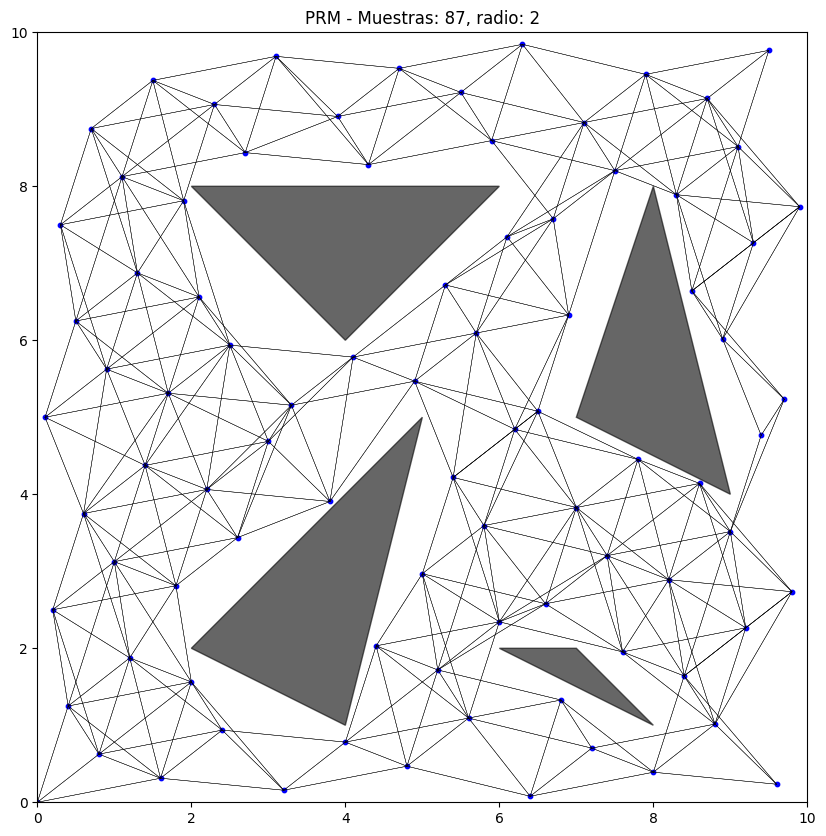

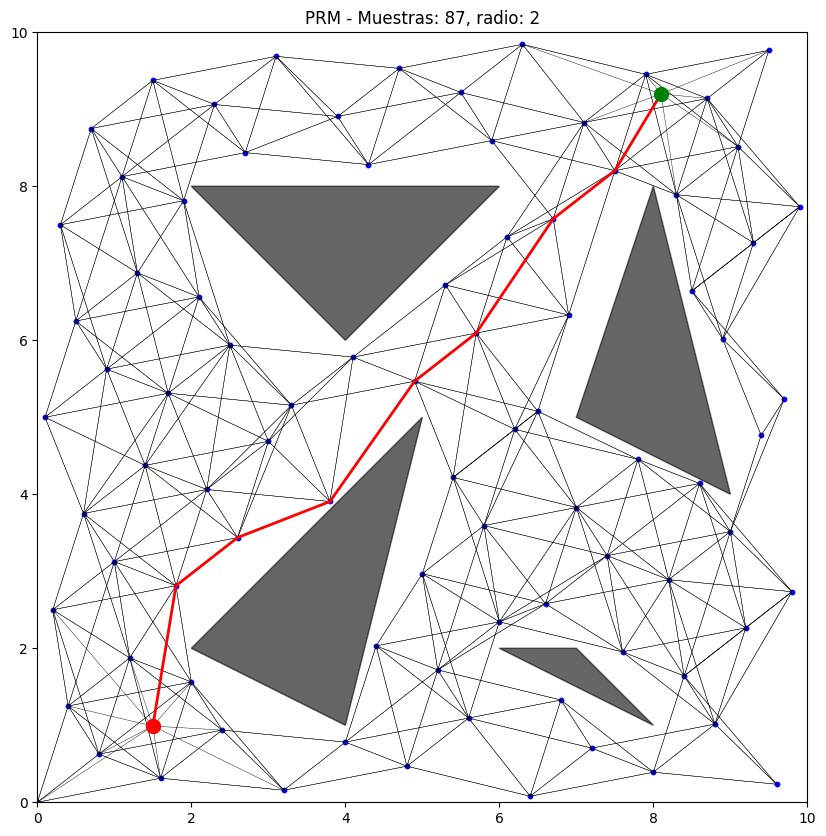

Costo del camino:  11.045094132494999
PRM ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  628
Radio de conexión:  2
Longitud del camino más corto: 11.045094132494999
-------------------------------------------------------------------


In [84]:
hammersley_points = hammersley_sequence(100, b1)*10
filtered_hammersley = [[np.float64(x) for x in row] for row in filter_samples(hammersley_points, obstacles)]

prm_instance = PRM(filtered_hammersley, obstacles, radio)

prm_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

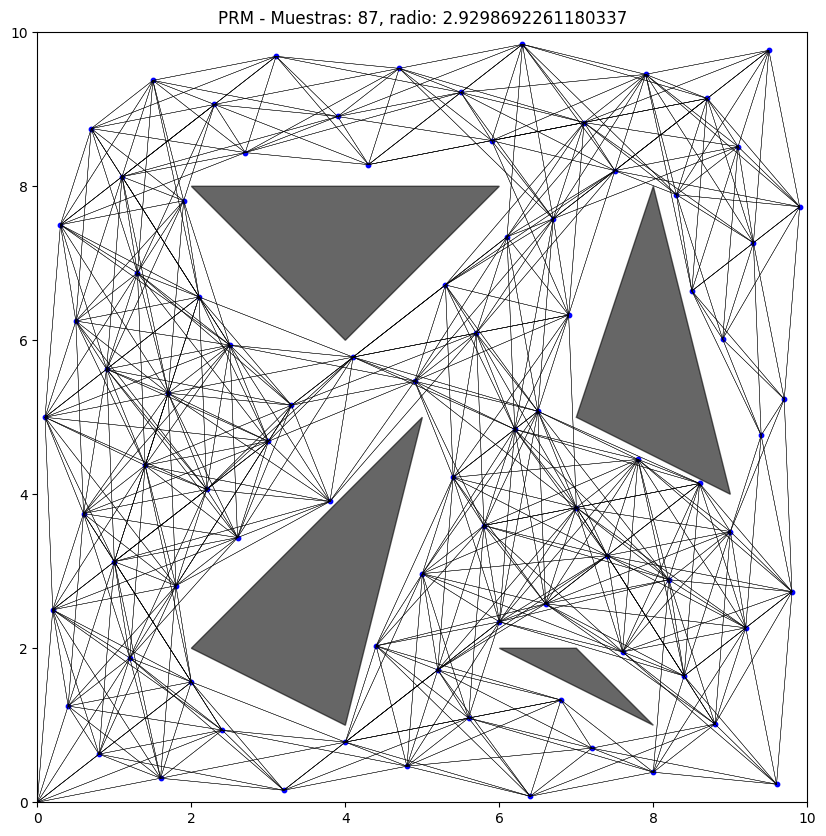

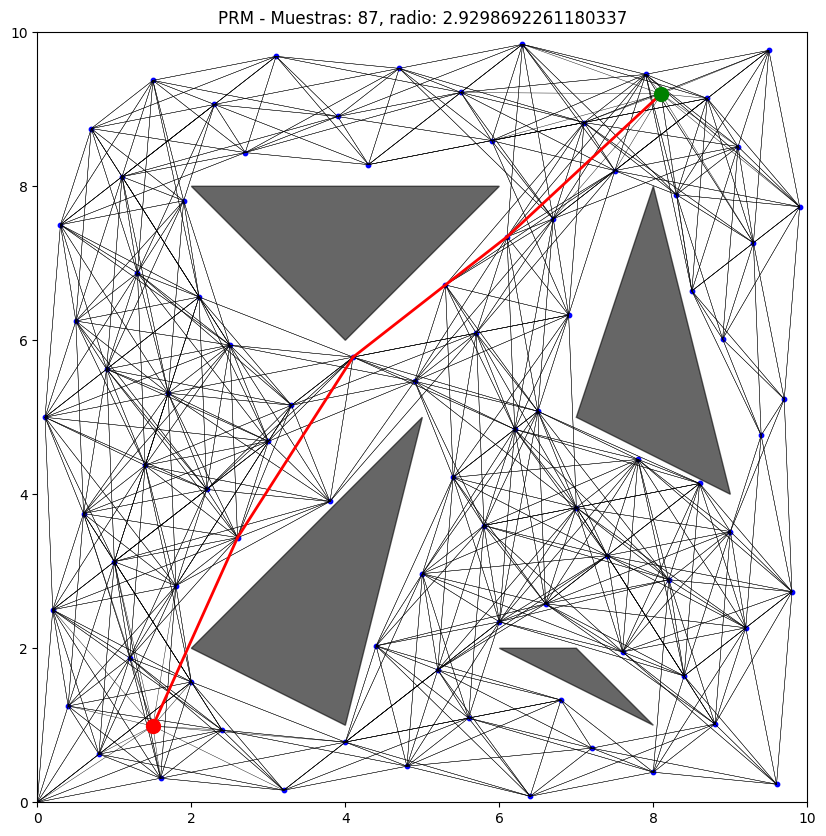

Costo del camino:  10.732650439804036
PRM* ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  1116
Radio de conexión:  2.9298692261180337
Longitud del camino más corto: 10.732650439804036


In [85]:
prm_star_instance = PRM_star(filtered_hammersley, obstacles)

prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

#### Análisis